<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/5/58/Uber_logo_2018.svg/1024px-Uber_logo_2018.svg.png" alt="UBER LOGO" width="50%" />

# UBER Pickups 

## Company's Description 📇

<a href="http://uber.com/" target="_blank">Uber</a> is one of the most famous startup in the world. It started as a ride-sharing application for people who couldn't afford a taxi. Now, Uber expanded its activities to Food Delivery with <a href="https://www.ubereats.com/fr-en" target="_blank">Uber Eats</a>, package delivery, freight transportation and even urban transportation with <a href="https://www.uber.com/fr/en/ride/uber-bike/" target="_blank"> Jump Bike</a> and <a href="https://www.li.me/" target="_blank"> Lime </a> that the company funded. 


The company's goal is to revolutionize transportation accross the globe. It operates now on about 70 countries and 900 cities and generates over $14 billion revenue! 😮

## Project 🚧

One of the main pain point that Uber's team found is that sometimes drivers are not around when users need them. For example, a user might be in San Francisco's Financial District whereas Uber drivers are looking for customers in Castro.  

(If you are not familiar with the bay area, check out <a href="https://www.google.com/maps/place/San+Francisco,+CA,+USA/@37.7515389,-122.4567213,13.43z/data=!4m5!3m4!1s0x80859a6d00690021:0x4a501367f076adata_samplef!8m2!3d37.7749295!4d-122.4194155" target="_blank">Google Maps</a>)

Eventhough both neighborhood are not that far away, users would still have to wait 10 to 15 minutes before being picked-up, which is too long. Uber's research shows that users accept to wait 5-7 minutes, otherwise they would cancel their ride. 

Therefore, Uber's data team would like to work on a project where **their app would recommend hot-zones in major cities to be in at any given time of day.**  

## Goals 🎯

Uber already has data about pickups in major cities. Your objective is to create algorithms that will determine where are the hot-zones that drivers should be in. Therefore you will:

* Create an algorithm to find hot zones 
* Visualize results on a nice dashboard 

## Scope of this project 🖼️

To start off, Uber wants to try this feature in New York city. Therefore you will only focus on this city. Data can be found here: 

👉👉<a href="https://full-stack-bigdata-datasets.s3.eu-west-3.amazonaws.com/Machine+Learning+non+Supervis%C3%A9/Projects/uber-trip-data.zip" target="_blank"> Uber Trip Data</a> 👈👈

**You only need to focus on New York City for this project**

## Helpers 🦮

To help you achieve this project, here are a few tips that should help you: 

### Clustering is your friend 

Clustering technics are a perfect fit for the job. Think about it, all the pickup locations can be gathered into different clusters. You can then use **cluster coordinates to pin hot zones** 😉
    

### Create maps with `plotly` 

Check out <a href="https://plotly.com/" target="_blank">Plotly</a> documentation, you can create maps and populate them easily. Obviously, there are other libraries but this one should do the job pretty well. 


### Start small grow big 

Eventhough Uber wants to have hot-zones per hour and per day of week, you should first **start small**. Pick one day at a given hour and **then start to generalize** your approach. 

## Deliverable 📬

To complete this project, your team should: 

* Have a map with hot-zones using any python library (`plotly` or anything else). 
* You should **at least** describe hot-zones per day of week. 
* Compare results with **at least** two unsupervised algorithms like KMeans and DBScan. 

Your maps should look something like this: 

<img src="https://full-stack-assets.s3.eu-west-3.amazonaws.com/images/Clusters_uber_pickups.png" alt="Uber Cluster Map" />

#   Plan

1. Introduction
2. Importing Libraries
3. Importing Data
4. Functions
5. Preprocessing
    - Transformer
    - Preprocessing
6.  K-Neighbors
7.  DBSCAN
8.  Cluster per Day
    - DBSCAN
    - KMEAN
    - Mean shift clustering
9.  Hours dependencies
10.  Conclusion

#   Introduction

In this notebook, we tackle an operational challenge faced by Uber: optimizing driver locations to reduce passenger wait times. Using Uber's pickup data from New York City, our objective is to develop algorithms that identify "hot-zones" where drivers should be positioned to meet demand efficiently. We'll employ clustering techniques to analyze pickup patterns and use Plotly for visualizing the identified zones. This analysis, focused on New York City, aims to provide a scalable solution to improve Uber's service efficiency and reduce wait times for users.

#   Importing Libraries

In [25]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import  OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.cluster import DBSCAN, KMeans, MeanShift, estimate_bandwidth

#   Importing Data

In [26]:
#   Importing the data
pathfile = 'uber-trip-data/uber-trip-data/uber-raw-data-apr14.csv'
data =pd.read_csv(pathfile)

In [27]:
data.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [28]:
"""Depiction of dataset variables and statistics"""
#Dataset information
print('Dataset information')
print(data.info())
#Top 5 rows of dataset
display('Dataset:', data.head())
print('General statistics of the dataset:')
display(data.describe(include='all'))
print('Number of rows:', data.shape[0])
print('Number of columns:', data.shape[1])
print()
print('Missing values for each variable')
display(data.isnull().sum())
print('percentage of missing value')
display(data.isna().sum() / (data.isna().sum() + data.count()) * 100)

Dataset information
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 564516 entries, 0 to 564515
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Date/Time  564516 non-null  object 
 1   Lat        564516 non-null  float64
 2   Lon        564516 non-null  float64
 3   Base       564516 non-null  object 
dtypes: float64(2), object(2)
memory usage: 17.2+ MB
None


'Dataset:'

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


General statistics of the dataset:


,Date/Time,Lat,Lon,Base
count,564516,564516.000000,564516.000000,564516
unique,41999,NaN,NaN,5
top,4/7/2014 20:21:00,NaN,NaN,B02682
freq,97,NaN,NaN,227808
mean,NaN,40.740005,-73.976817,NaN
std,NaN,0.036083,0.050426,NaN
min,NaN,40.072900,-74.773300,NaN
25%,NaN,40.722500,-73.997700,NaN
50%,NaN,40.742500,-73.984800,NaN
75%,NaN,40.760700,-73.970000,NaN


Number of rows: 564516
Number of columns: 4

Missing values for each variable


Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

percentage of missing value


Date/Time    0.0
Lat          0.0
Lon          0.0
Base         0.0
dtype: float64

In [29]:
''' 
Dataset has no missing values, it is composed of 4 columns and 564516 rows, the columns are: Date/Time, Latitude, Longitude and Base. 
This allows us to know the date and time, the location of the order and the corresponding base.
'''

' \nDataset has no missing values, it is composed of 4 columns and 564516 rows, the columns are: Date/Time, Latitude, Longitude and Base. \nThis allows us to know the date and time, the location of the order and the corresponding base.\n'

# Functions

In [30]:
#   Function to plot the data
'''
The function plot_data is used to plot the data in the dataset. 
It takes the data and the day name as input and plots the latitude and longitude of the data,
and colors the data points based on the cluster they belong to.
'''

def create_scatter_map(data, day_name):
    # Create a scatter map for the given data
    fig = go.Figure(go.Scattermapbox(
        lat=data['Lat'],
        lon=data['Lon'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=9,
            color=data['cluster'],  # Color by cluster
            showscale=True  # Shows color scale
        ),
        text=['Cluster: {}'.format(cluster) for cluster in data['cluster']],  # Hover text
    ))

    # Update the layout
    fig.update_layout(
        mapbox_style="carto-positron",
        mapbox_zoom=8,  # Adjust as needed
        mapbox_center={"lat": data['Lat'].mean(), "lon": data['Lon'].mean()},
        title=f"Scatter Map for {day_name}"
    )

    # Show the figure
    fig.show()


#   Function to preprocess the data for a given day
def preprocess_day(data, day):
    day_data = data[data.day == day]
    if not day_data.empty:
        return preprocessor.fit_transform(day_data), day_data
    else:
        print(f"No data available for {day}.")
        return None, None

#   EDA

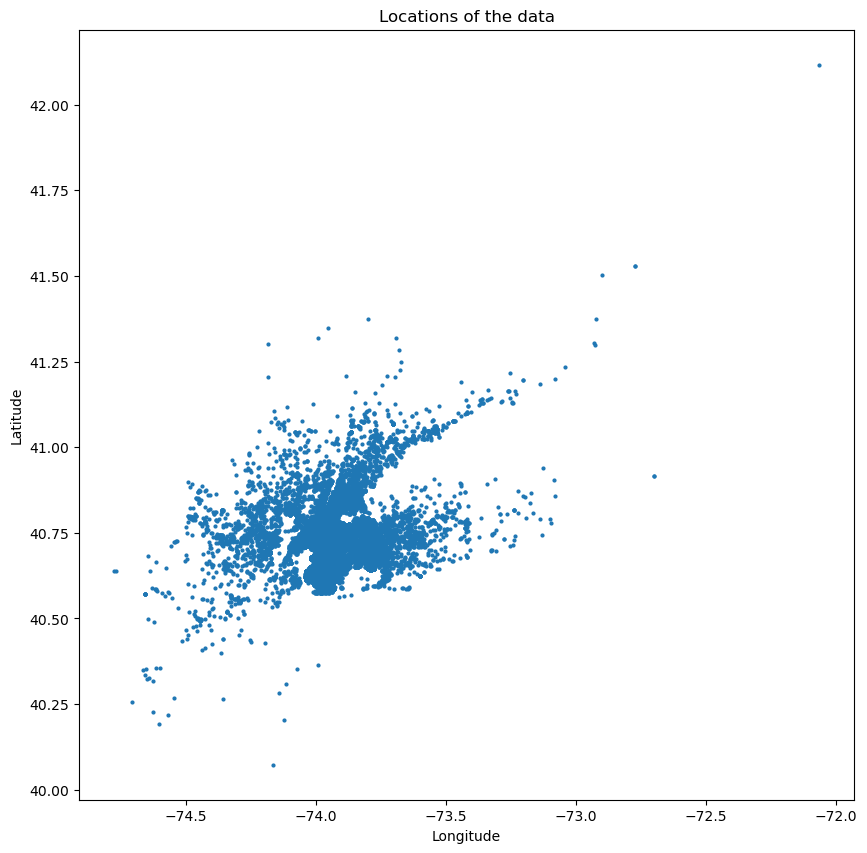

In [31]:
# EDA
# Plot locations of the data
plt.figure(figsize=(10, 10))
plt.plot(data['Lon'], data['Lat'], 'o', markersize=2)
plt.title('Locations of the data')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()



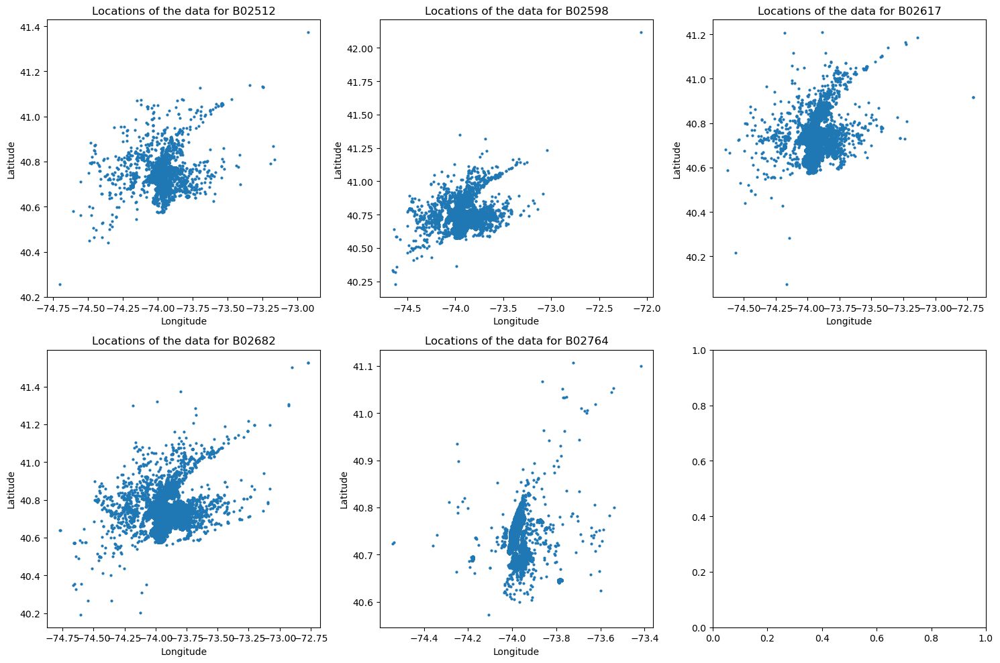

In [32]:
# EDA
# Plot locations of the data per base in different subplots
bases = data['Base'].unique()
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()
for i, base in enumerate(bases):
    base_data = data[data['Base'] == base]
    axes[i].plot(base_data['Lon'], base_data['Lat'], 'o', markersize=2)
    axes[i].set_title(f'Locations of the data for {base}')
    axes[i].set_xlabel('Longitude')
    axes[i].set_ylabel('Latitude')
plt.tight_layout()
plt.show()

In [33]:
# Here we can see the locations of the data for each base. The base B02617 has data points concentrated in the north part of the city, the base B02764 is concerned with the south east part, 
# and the base B02598 is mostly about the south west. Finally the last two are more spread out and quite centered.

#   Preprocessing

In [34]:
#  Data Preprocessing
data['Date/Time'] = pd.to_datetime(data['Date/Time'], format='%m/%d/%Y %H:%M:%S') # Convert to datetime
data['Date'] = data['Date/Time'].dt.date # Extract date
data['Time'] = data['Date/Time'].dt.time # Extract time
data['day'] = data['Date/Time'].dt.strftime('%A') # Extract day

In [35]:
data.head()

,Date/Time,Lat,Lon,Base,Date,Time,day
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,2014-04-01,00:11:00,Tuesday
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,2014-04-01,00:17:00,Tuesday
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,2014-04-01,00:21:00,Tuesday
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,2014-04-01,00:28:00,Tuesday
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,2014-04-01,00:33:00,Tuesday


In [36]:
# Dropping columns that are not needed
col_drop = ['Date/Time','Date'] # Columns to drop
data = data.drop(columns=col_drop)

In [38]:
data.head()

,Lat,Lon,Base,Time,day
0,40.7690,-73.9549,B02512,00:11:00,Tuesday
1,40.7267,-74.0345,B02512,00:17:00,Tuesday
2,40.7316,-73.9873,B02512,00:21:00,Tuesday
3,40.7588,-73.9776,B02512,00:28:00,Tuesday
4,40.7594,-73.9722,B02512,00:33:00,Tuesday


In [39]:
#   Data Sampling
data_sample = data.sample(50000)
data_sample_day = data_sample.copy()
data_sample_day = data_sample_day.drop(columns='Time')

##  Transformer

In [40]:
# Automatically detect names of numeric/categorical columns
numeric_features = []
categorical_features = []
for i,t in data_sample.dtypes.items():
    if ('float' in str(t)) or ('int' in str(t)) :
        numeric_features.append(i)
    else :
        categorical_features.append(i)

print('Found numeric features ', numeric_features)
print('Found categorical features ', categorical_features)

Found numeric features  ['Lat', 'Lon']
Found categorical features  ['Base', 'Time', 'day']


##  Preprocessor

In [41]:
# Positions des colonnes quantitatives dans X
numeric_transformer = StandardScaler()

# Création du transformer pour les variables catégorielles
# Positions des colonnes catégorielles dans X
categorical_transformer = OneHotEncoder(drop='first')

# On combine les transformers dans un ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Preprocessings sur le dataset
print("Preprocessing sur le train set...")
print(data_sample.head())
X = preprocessor.fit_transform(data_sample) # fit_transform !!
print('...Terminé.')
print(X[0:5, :])
print()

Preprocessing sur le train set...
            Lat      Lon    Base      Time        day
311775  40.7404 -74.0058  B02617  12:28:00     Sunday
11652   41.0152 -74.0340  B02512  10:57:00   Thursday
116383  40.7904 -73.9539  B02598  17:39:00  Wednesday
548007  40.7591 -73.9765  B02682  16:29:00  Wednesday
329247  40.7511 -73.9742  B02682  13:37:00    Tuesday
...Terminé.
  (0, 0)	0.007638059934622397
  (0, 1)	-0.5813770002581692
  (0, 3)	1.0
  (0, 753)	1.0
  (0, 1447)	1.0
  (1, 0)	7.672922585768942
  (1, 1)	-1.1504966565546442
  (1, 662)	1.0
  (1, 1448)	1.0
  (2, 0)	1.4023404845768914
  (2, 1)	0.46604534590381186
  (2, 2)	1.0
  (2, 1064)	1.0
  (2, 1450)	1.0
  (3, 0)	0.5292567667507351
  (3, 1)	0.009942358943067404
  (3, 4)	1.0
  (3, 994)	1.0
  (3, 1450)	1.0
  (4, 0)	0.306104378808083
  (4, 1)	0.05635991956307912
  (4, 4)	1.0
  (4, 822)	1.0
  (4, 1449)	1.0



#  K-Neighbors

In [42]:
#   Model Training
k = 3  # Number of nearest neighbors

# Fit the nearest neighbors model
nearest_neighbors = NearestNeighbors(n_neighbors=k, metric='manhattan')
nearest_neighbors.fit(X)
distances, indices = nearest_neighbors.kneighbors(X)

# Sort the distances
sorted_distances = np.sort(distances[:, k-1], axis=0)

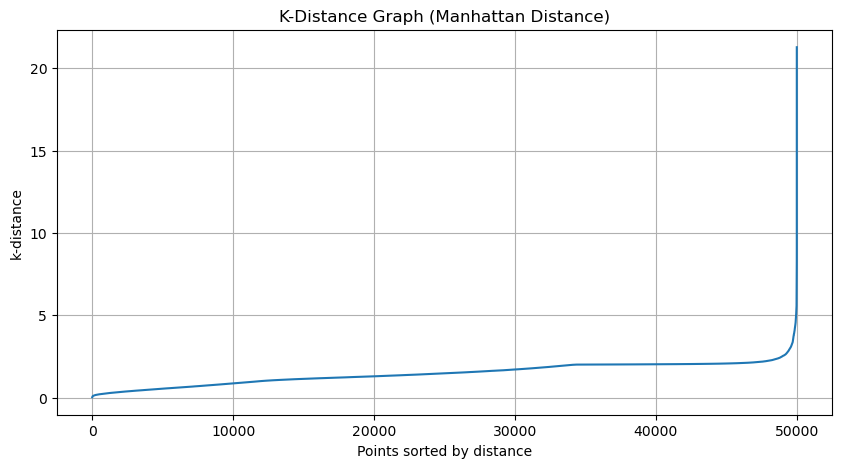

In [43]:
plt.figure(figsize=(10, 5))
plt.plot(sorted_distances)
plt.title("K-Distance Graph (Manhattan Distance)")
plt.xlabel("Points sorted by distance")
plt.ylabel("k-distance")
plt.grid(True)
plt.show()

#   DBSCAN

In [44]:
#   Model Training

# Fit the DBSCAN model
db = DBSCAN(eps=2, min_samples=100, metric="manhattan") # eps=2 because the k-distance graph shows a steep rise at around 2
db.fit(X)

print('The clusters are :', np.unique(db.labels_))


data_sample["cluster"] = db.labels_ # Add the cluster labels to the data
data_sample.head()

The clusters are : [-1  0  1  2  3  4  5  6  7]


,Lat,Lon,Base,Time,day,cluster
311775,40.7404,-74.0058,B02617,12:28:00,Sunday,1
11652,41.0152,-74.0340,B02512,10:57:00,Thursday,-1
116383,40.7904,-73.9539,B02598,17:39:00,Wednesday,-1
548007,40.7591,-73.9765,B02682,16:29:00,Wednesday,-1
329247,40.7511,-73.9742,B02682,13:37:00,Tuesday,2


In [45]:
#  Number of points in each cluster
data_sample['cluster'].value_counts()

'''
We observe the presence of several clusters, the cluster -1 corresponds to the noise, however the clusters here are based on the entire week and not on a specific day.
For a specific day, either none or a few clusters are relevant, so we will look at this in the next step.
'''

'\nWe observe the presence of several clusters, the cluster -1 corresponds to the noise, however the clusters here are based on the entire week and not on a specific day.\nFor a specific day, either none or a few clusters are relevant, so we will look at this in the next step.\n'

In [46]:
#  Plotting the clusters
week = 'week'
create_scatter_map(data_sample[data_sample['cluster'] != -1], week)

In [47]:
#  Number of clusters for each day
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Print the number of clusters for each day
for day in weekdays:
    print(f'{day} clusters:', data_sample[data_sample.day == day].cluster.value_counts())

'''
We observe here how the clusters are distributed over the days of the week, we can see that the number of clusters is not the same for each day,
There are days with no relevant clusters, and days with several clusters.
'''

Monday clusters: cluster
-1    5381
Name: count, dtype: int64
Tuesday clusters: cluster
-1    5221
 2    1843
 5    1113
Name: count, dtype: int64
Wednesday clusters: cluster
-1    6893
 0    1368
 2     814
 4     416
Name: count, dtype: int64
Thursday clusters: cluster
-1    7640
Name: count, dtype: int64
Friday clusters: cluster
-1    6072
 2    1753
Name: count, dtype: int64
Saturday clusters: cluster
-1    2851
 2    1789
 3    1709
 7     612
Name: count, dtype: int64
Sunday clusters: cluster
-1    2963
 2     779
 1     606
 6     177
Name: count, dtype: int64


'\nWe observe here how the clusters are distributed over the days of the week, we can see that the number of clusters is not the same for each day,\nThere are days with no relevant clusters, and days with several clusters.\n'

# Cluster per Day

In [48]:
#   Copying the data
data_sample_filtered = data_sample_day.copy()

In [49]:
# Automatically detect names of numeric/categorical columns
numeric_features = []
categorical_features = []
for i,t in data_sample_filtered.dtypes.items():
    if ('float' in str(t)) or ('int' in str(t)) :
        numeric_features.append(i)
    else :
        categorical_features.append(i)

print('Found numeric features ', numeric_features)
print('Found categorical features ', categorical_features)

Found numeric features  ['Lat', 'Lon']
Found categorical features  ['Base', 'day']


In [50]:
# Positions des colonnes quantitatives dans X
numeric_transformer = StandardScaler()

# Création du transformer pour les variables catégorielles
# Positions des colonnes catégorielles dans X
categorical_transformer = OneHotEncoder(drop='first')

# On combine les transformers dans un ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ])

In [51]:
print("Preprocessing sur le train set...")
print(data_sample_filtered.head())

# Preprocess data for each day
X_Monday, original_Monday = preprocess_day(data_sample_filtered, 'Monday')
X_Tuesday, original_Tuesday = preprocess_day(data_sample_filtered, 'Tuesday')
X_Wednesday, original_Wednesday = preprocess_day(data_sample_filtered, 'Wednesday')
X_Thursday, original_Thursday = preprocess_day(data_sample_filtered, 'Thursday')
X_Friday, original_Friday = preprocess_day(data_sample_filtered, 'Friday')
X_Saturday, original_Saturday = preprocess_day(data_sample_filtered, 'Saturday')
X_Sunday, original_Sunday = preprocess_day(data_sample_filtered, 'Sunday')

print('...Terminé.')

# Print first 5 rows if data exists
if X_Wednesday is not None:
    print(X_Wednesday[0:5, :])
else:
    print("X_Wednesday is empty")
print()

# Check and use the original_day_data DataFrame
if original_Wednesday is not None:
    print(original_Wednesday)


Preprocessing sur le train set...
            Lat      Lon    Base        day
311775  40.7404 -74.0058  B02617     Sunday
11652   41.0152 -74.0340  B02512   Thursday
116383  40.7904 -73.9539  B02598  Wednesday
548007  40.7591 -73.9765  B02682  Wednesday
329247  40.7511 -73.9742  B02682    Tuesday
...Terminé.
[[ 1.38902943e+00  5.23514975e-01]
 [ 4.75741763e-01  3.58667012e-02]
 [-4.92985097e-01 -6.35189109e-01]
 [-8.19784519e-01 -6.69712881e-01]
 [ 5.16591691e-01  1.34292961e-03]]

            Lat      Lon    Base        day
116383  40.7904 -73.9539  B02598  Wednesday
548007  40.7591 -73.9765  B02682  Wednesday
216612  40.7259 -74.0076  B02598  Wednesday
78925   40.7147 -74.0092  B02598  Wednesday
551170  40.7605 -73.9781  B02682  Wednesday
...         ...      ...     ...        ...
541895  40.8563 -73.8695  B02682  Wednesday
214636  40.7874 -73.9547  B02598  Wednesday
39856   40.7170 -73.9544  B02598  Wednesday
488257  40.7667 -73.9691  B02682  Wednesday
40774   40.7155 -73.9540  B02

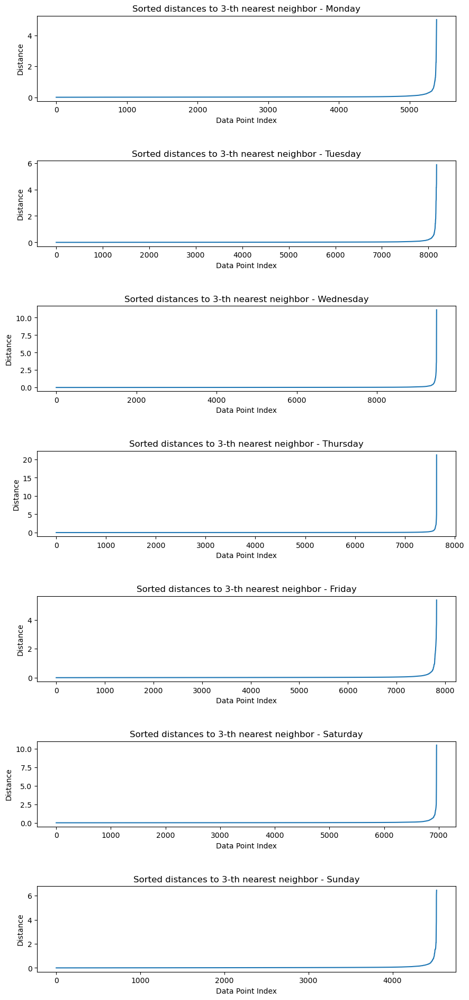

In [52]:
k = 3  # Number of neighbors
min_size = 10 # Minimum size of the dataset to consider

# Datasets for each day
datasets = {
    "Monday": X_Monday,
    "Tuesday": X_Tuesday,
    "Wednesday": X_Wednesday,
    "Thursday": X_Thursday,
    "Friday": X_Friday,
    "Saturday": X_Saturday,
    "Sunday": X_Sunday
}

# Initialize the NearestNeighbors model
nearest_neighbors = NearestNeighbors(n_neighbors=k, metric='manhattan')

# Create subplots
fig, axes = plt.subplots(nrows=len(datasets), ncols=1, figsize=(10, 20))
fig.tight_layout(pad=6.0)

# Process and plot for each day
for i, (day, data) in enumerate(datasets.items()):
    if data is not None and data.size > min_size:
        # Fit the model and find nearest neighbors
        nearest_neighbors.fit(data)
        distances, indices = nearest_neighbors.kneighbors(data)

        # Sort the distances
        sorted_distances = np.sort(distances[:, k-1], axis=0)

        # Plotting
        axes[i].plot(sorted_distances)
        axes[i].set_title(f'Sorted distances to {k}-th nearest neighbor - {day}')
        axes[i].set_xlabel('Data Point Index')
        axes[i].set_ylabel('Distance')
    else:
        axes[i].set_title(f'No data available for {day}')
        axes[i].axis('off')

plt.show()


##  DBSCAN

In [53]:
min_size = 100

db = DBSCAN(eps=0.3, min_samples=10, metric="manhattan")

# Datasets for each day
datasets = {
    "Monday": X_Monday,
    "Tuesday": X_Tuesday,
    "Wednesday": X_Wednesday,
    "Thursday": X_Thursday,
    "Friday": X_Friday,
    "Saturday": X_Saturday,
    "Sunday": X_Sunday
}


# Store the original datasets
original_datasets = { 
    "Monday": original_Monday,
    "Tuesday": original_Tuesday,
    "Wednesday": original_Wednesday,
    "Thursday": original_Thursday,
    "Friday": original_Friday,
    "Saturday": original_Saturday,
    "Sunday": original_Sunday
}

# Process each day
for day, data in datasets.items():
    if data is not None and data.size > min_size:  # Check if the dataset is not empty
        day_db = db.fit(data)
        # Add cluster labels as a new column to the original dataset
        original_datasets[day].loc[:, 'cluster'] = day_db.labels_
        print(f'{day}:', np.unique(day_db.labels_))
    else:
        print(f"Dataset for {day} is empty.")


C:\Users\morab\AppData\Local\Temp\ipykernel_1540\890146538.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\morab\AppData\Local\Temp\ipykernel_1540\890146538.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Monday: [-1  0  1  2  3  4  5]
Tuesday: [-1  0  1  2  3  4]


C:\Users\morab\AppData\Local\Temp\ipykernel_1540\890146538.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\morab\AppData\Local\Temp\ipykernel_1540\890146538.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Wednesday: [-1  0  1  2  3  4  5  6  7  8]
Thursday: [-1  0  1  2  3  4]
Friday: [-1  0  1  2  3  4  5  6  7  8]
Saturday: [-1  0  1  2  3  4  5]
Sunday: [-1  0  1  2]


C:\Users\morab\AppData\Local\Temp\ipykernel_1540\890146538.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\morab\AppData\Local\Temp\ipykernel_1540\890146538.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\morab\AppData\Local\Temp\ipykernel_1540\890146538.py:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

In [54]:
# Assuming original_datasets is a dictionary containing the datasets for each day
for day, data in original_datasets.items():
    if data is not None and not data.empty:
        create_scatter_map(data[data['cluster'] != -1], day)


## KMean

In [55]:
# Number of clusters for KMeans
n_clusters = 5  # Number of clusters

# Datasets for each day
datasets = {
    "Monday": X_Monday,
    "Tuesday": X_Tuesday,
    "Wednesday": X_Wednesday,
    "Thursday": X_Thursday,
    "Friday": X_Friday,
    "Saturday": X_Saturday,
    "Sunday": X_Sunday
}

# Original datasets stored separately
original_datasets = {
    "Monday": original_Monday,
    "Tuesday": original_Tuesday,
    "Wednesday": original_Wednesday,
    "Thursday": original_Thursday,
    "Friday": original_Friday,
    "Saturday": original_Saturday,
    "Sunday": original_Sunday
}

# Process each day with KMeans
for day, data in datasets.items():
    if data is not None and len(data) > min_size:  # Check if the dataset is not empty
        kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init='auto').fit(data)
        # Add cluster labels as a new column to the original dataset
        original_datasets[day].loc[:, 'cluster'] = kmeans.labels_
        print(f'{day}:', np.unique(kmeans.labels_))
    else:
        print(f"Dataset for {day} is empty.")


Monday: [0 1 2 3 4]
Tuesday: [0 1 2 3 4]
Wednesday: [0 1 2 3 4]
Thursday: [0 1 2 3 4]
Friday: [0 1 2 3 4]
Saturday: [0 1 2 3 4]
Sunday: [0 1 2 3 4]


In [56]:
# Assuming original_datasets is a dictionary containing the datasets for each day
for day, data in original_datasets.items():
    if data is not None and not data.empty:
        create_scatter_map(data[data['cluster'] != -1], day)


## Mean shift clustering

In [57]:
# Datasets for each day
datasets = {
    "Monday": X_Monday,
    "Tuesday": X_Tuesday,
    "Wednesday": X_Wednesday,
    "Thursday": X_Thursday,
    "Friday": X_Friday,
    "Saturday": X_Saturday,
    "Sunday": X_Sunday
}

# Original datasets stored separately
original_datasets = {
    "Monday": original_Monday,
    "Tuesday": original_Tuesday,
    "Wednesday": original_Wednesday,
    "Thursday": original_Thursday,
    "Friday": original_Friday,
    "Saturday": original_Saturday,
    "Sunday": original_Sunday
}

# Process each day with Mean Shift
for day, data in datasets.items():
    if data is not None and len(data) > min_size:  # Check if the dataset is not empty
        # Estimate bandwidth
        bandwidth = estimate_bandwidth(data, quantile=0.95)  # Adjust the quantile as needed
        meanshift = MeanShift(bandwidth=bandwidth).fit(data)
        # Add cluster labels as a new column to the original dataset
        original_datasets[day].loc[:, 'cluster'] = meanshift.labels_
        print(f'{day}:', np.unique(meanshift.labels_))
    else:
        print(f"Dataset for {day} is empty.")


Monday: [0]
Tuesday: [0 1 2 3 4 5]
Wednesday: [0 1 2 3 4 5 6 7]
Thursday: [0 1 2 3 4]
Friday: [0 1 2 3 4 5]
Saturday: [0 1 2 3 4]
Sunday: [0 1 2 3]


In [58]:
# Assuming original_datasets is a dictionary containing the datasets for each day
for day, data in original_datasets.items():
    if data is not None and not data.empty:
        create_scatter_map(data[data['cluster'] != -1], day)


# Depending on time of day

In [59]:
# Copy the data
data_sample_per_day = data_sample.copy()
data_sample_per_day.head()

,Lat,Lon,Base,Time,day,cluster
311775,40.7404,-74.0058,B02617,12:28:00,Sunday,1
11652,41.0152,-74.0340,B02512,10:57:00,Thursday,-1
116383,40.7904,-73.9539,B02598,17:39:00,Wednesday,-1
548007,40.7591,-73.9765,B02682,16:29:00,Wednesday,-1
329247,40.7511,-73.9742,B02682,13:37:00,Tuesday,2


In [60]:
# Automatically detect names of numeric/categorical columns
numeric_features = []
categorical_features = []
for i,t in data_sample_per_day.dtypes.items():
    if ('float' in str(t)) or ('int' in str(t)) :
        numeric_features.append(i)
    else :
        categorical_features.append(i)

print('Found numeric features ', numeric_features)
print('Found categorical features ', categorical_features)

Found numeric features  ['Lat', 'Lon', 'cluster']
Found categorical features  ['Base', 'Time', 'day']


In [61]:
# Positions des colonnes quantitatives dans X
numeric_transformer = StandardScaler()

# Création du transformer pour les variables catégorielles
# Positions des colonnes catégorielles dans X
categorical_transformer = OneHotEncoder(drop='first')

# On combine les transformers dans un ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ])

In [62]:
print("Preprocessing sur le train set...")
print(data_sample_per_day.head())

def preprocess_day(data, day):
    day_data = data[data.day == day]
    if not day_data.empty:
        return preprocessor.fit_transform(day_data), day_data
    else:
        print(f"No data available for {day}.")
        return None, None

# Preprocess data for each day
X_Monday, original_Monday = preprocess_day(data_sample_per_day, 'Monday')
X_Tuesday, original_Tuesday = preprocess_day(data_sample_per_day, 'Tuesday')
X_Wednesday, original_Wednesday = preprocess_day(data_sample_per_day, 'Wednesday')
X_Thursday, original_Thursday = preprocess_day(data_sample_per_day, 'Thursday')
X_Friday, original_Friday = preprocess_day(data_sample_per_day, 'Friday')
X_Saturday, original_Saturday = preprocess_day(data_sample_per_day, 'Saturday')
X_Sunday, original_Sunday = preprocess_day(data_sample_per_day, 'Sunday')

print('...Terminé.')

# Print first 5 rows if data exists
if X_Wednesday is not None:
    print(X_Wednesday[0:5, :])
else:
    print("X_Wednesday is empty")
print()

# Check and use the original_day_data DataFrame
if original_Wednesday is not None:
    print(original_Wednesday)


Preprocessing sur le train set...
            Lat      Lon    Base      Time        day  cluster
311775  40.7404 -74.0058  B02617  12:28:00     Sunday        1
11652   41.0152 -74.0340  B02512  10:57:00   Thursday       -1
116383  40.7904 -73.9539  B02598  17:39:00  Wednesday       -1
548007  40.7591 -73.9765  B02682  16:29:00  Wednesday       -1
329247  40.7511 -73.9742  B02682  13:37:00    Tuesday        2
...Terminé.
[[ 1.38902943e+00  5.23514975e-01 -4.86579068e-01]
 [ 4.75741763e-01  3.58667012e-02 -4.86579068e-01]
 [-4.92985097e-01 -6.35189109e-01  2.97482381e-01]
 [-8.19784519e-01 -6.69712881e-01  2.97482381e-01]
 [ 5.16591691e-01  1.34292961e-03 -4.86579068e-01]]

            Lat      Lon    Base      Time        day  cluster
116383  40.7904 -73.9539  B02598  17:39:00  Wednesday       -1
548007  40.7591 -73.9765  B02682  16:29:00  Wednesday       -1
216612  40.7259 -74.0076  B02598  20:39:00  Wednesday        0
78925   40.7147 -74.0092  B02598  17:22:00  Wednesday        0
5511

In [63]:
# Number of clusters for KMeans
n_clusters = 5  # Number of clusters

# Datasets for each day
datasets = {
    "Monday": X_Monday,
    "Tuesday": X_Tuesday,
    "Wednesday": X_Wednesday,
    "Thursday": X_Thursday,
    "Friday": X_Friday,
    "Saturday": X_Saturday,
    "Sunday": X_Sunday
}

# Original datasets stored separately
original_datasets = {
    "Monday": original_Monday,
    "Tuesday": original_Tuesday,
    "Wednesday": original_Wednesday,
    "Thursday": original_Thursday,
    "Friday": original_Friday,
    "Saturday": original_Saturday,
    "Sunday": original_Sunday
}

# Process each day with KMeans
for day, data in datasets.items():
    if data is not None and len(data) > min_size:  # Check if the dataset is not empty
        kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init='auto').fit(data)
        # Add cluster labels as a new column to the original dataset
        original_datasets[day].loc[:, 'cluster'] = kmeans.labels_
        print(f'{day}:', np.unique(kmeans.labels_))
    else:
        print(f"Dataset for {day} is empty.")


Monday: [0 1 2 3 4]
Tuesday: [0 1 2 3 4]
Wednesday: [0 1 2 3 4]
Thursday: [0 1 2 3 4]
Friday: [0 1 2 3 4]
Saturday: [0 1 2 3 4]
Sunday: [0 1 2 3 4]


In [64]:
# Assuming original_datasets is a dictionary containing the datasets for each day
for day, data in original_datasets.items():
    if data is not None and not data.empty:
        create_scatter_map(data[data['cluster'] != -1], day)

# Conclusion

In [65]:
'''
Conclusion:
The Uber Pickup dataset was analyzed and preprocessed, and then clustered using DBSCAN, KMeans, and Mean Shift.
The clusters were visualized on a scatter map for each day of the week successfully.
The cluster performance was the best with KMeans, followed by DBSCAN and Mean Shift.
It was thus used to cluster the data for each day of the week taking into account the time and location of the orders.
The results were visualized on scatter map.
'''


'\nConclusion:\nThe Uber Pickup dataset was analyzed and preprocessed, and then clustered using DBSCAN, KMeans, and Mean Shift.\nThe clusters were visualized on a scatter map for each day of the week successfully.\nThe cluster performance was the best with KMeans, followed by DBSCAN and Mean Shift.\nIt was thus used to cluster the data for each day of the week taking into account the time and location of the orders.\nThe results were visualized on scatter map.\n'